In [1]:
# imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import torch
from torchvision.models import resnet18

# Question 2

## Saliency Maps

### Preprocessing

In [2]:
def dataset_processing():
    unnorm_imgs = []
    images = []
    labels = []
    main_folder = "datasets/network visualization"
    subfolders = sorted(os.listdir(main_folder))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    for sub in subfolders:
        img = os.listdir(main_folder + "/" + sub)[1]
        img = cv2.imread(main_folder + "/" + sub + "/" + img)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224, 224))
        unnorm_imgs.append(img)
        # plt.imshow(img)
        # plt.show()
        img = (img / 255.0 - mean) / std
        images.append(img)
        labels.append(sub)
    
    unnorm_imgs = np.array(unnorm_imgs)
    images = np.array(images)
    labels = np.array(labels)
    return unnorm_imgs, images, labels

In [3]:
unnorm_imgs, images, labels = dataset_processing()

### Classification and Saliency Map - Single function

In [4]:
def classify_and_generate_saliency(images, labels, classes):
    model = resnet18(pretrained=True)
    model.fc = torch.nn.Linear(model.fc.in_features, 10)
    model.load_state_dict(torch.load('datasets/network_visualization.pth'))
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    images_tensor = torch.tensor(images, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
    model.eval()
    images_tensor.requires_grad = True
    outputs = model(images_tensor)
    
    predicted_indices = torch.argmax(outputs, dim=1)
    predicted_labels = classes[predicted_indices.cpu().numpy()]
    
    results_df = pd.DataFrame({'Original Label': labels, 'Predicted Label': predicted_labels})
    print(results_df)
    
    selected_outputs = outputs[range(outputs.shape[0]), predicted_indices]
    model.zero_grad()
    selected_outputs.backward(torch.ones_like(selected_outputs))
    gradients = images_tensor.grad.abs()
    
    saliency = gradients.permute(0, 2, 3, 1)
    saliency = saliency.detach().cpu().numpy()
    for i in range(saliency.shape[0]):
        saliency[i] = (saliency[i] - saliency[i].min()) / (saliency[i].max() - saliency[i].min())
    
    return predicted_labels, saliency

In [5]:
def visualize_saliency_maps(predicted_labels, saliency, images):
    fig, axes = plt.subplots(2, 10, figsize=(20, 4))

    for i in range(10):
        axes[0, i].imshow(images[i])
        axes[0, i].axis('off')
        axes[0, i].set_title(predicted_labels[i])
        
        axes[1, i].imshow(saliency[i], cmap='hot')
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()

### Original Dataset

In [6]:
predicted_labels, saliency = classify_and_generate_saliency(images, labels, labels)

/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


     Original Label   Predicted Label
0        arctic fox        arctic fox
1             corgi             corgi
2      electric ray      electric ray
3          goldfish          goldfish
4  hammerhead shark  hammerhead shark
5             horse             horse
6       hummingbird       hummingbird
7      indigo finch      indigo finch
8              puma              puma
9         red panda         red panda


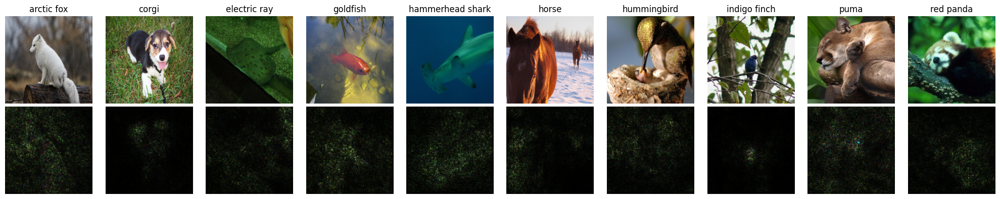

In [7]:
visualize_saliency_maps(predicted_labels, saliency, unnorm_imgs)

### Zeroed pixel Dataset

In [8]:
def zero_out_pixels(images, saliency):
    threshold = 0.02
    zeroed_images = images.copy()
    for i in range(images.shape[0]):
        mask = saliency[i] < threshold
        zeroed_images[i][mask] = 0
    return zeroed_images

In [9]:
zeroed_images = zero_out_pixels((unnorm_imgs / 255.0).astype(np.float64), saliency)
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
zeroed_images_norm = (zeroed_images - mean) / std

In [10]:
zeroed_predicted_labels, zeroed_saliency = classify_and_generate_saliency(zeroed_images_norm, labels, labels)

/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


     Original Label   Predicted Label
0        arctic fox              puma
1             corgi  hammerhead shark
2      electric ray      indigo finch
3          goldfish      indigo finch
4  hammerhead shark  hammerhead shark
5             horse      indigo finch
6       hummingbird      electric ray
7      indigo finch      indigo finch
8              puma              puma
9         red panda  hammerhead shark


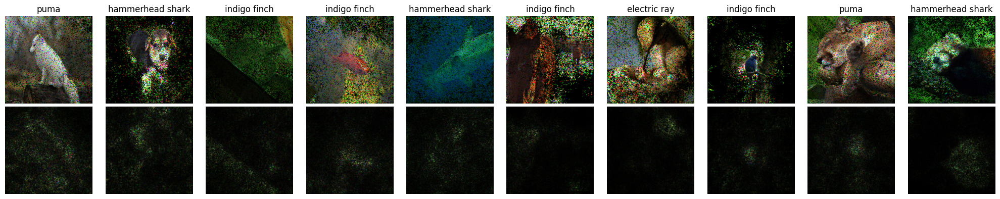

In [11]:
visualize_saliency_maps(zeroed_predicted_labels, zeroed_saliency, zeroed_images)

### Gaussian noise Dataset

In [12]:
def gaussian_noise_pixels(images, saliency):
    threshold = 0.001
    noisy_images = images.copy()
    noise = np.random.normal(0, 0.5, images[0].shape)
    for i in range(images.shape[0]):
        mask = saliency[i] < threshold
        noisy_images[i][mask] = noise[mask]
        noisy_images[i] = (noisy_images[i] - noisy_images[i].min()) / (noisy_images[i].max() - noisy_images[i].min())
    return noisy_images

In [13]:
noisy_images = gaussian_noise_pixels((unnorm_imgs / 255.0).astype(np.float64), saliency)
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
noisy_images_norm = (noisy_images - mean) / std

In [14]:
noisy_predicted_labels, noisy_saliency = classify_and_generate_saliency(noisy_images_norm, labels, labels)

     Original Label   Predicted Label
0        arctic fox        arctic fox
1             corgi             corgi
2      electric ray      electric ray
3          goldfish      electric ray
4  hammerhead shark  hammerhead shark
5             horse        arctic fox
6       hummingbird      electric ray
7      indigo finch      electric ray
8              puma      electric ray
9         red panda      electric ray


/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


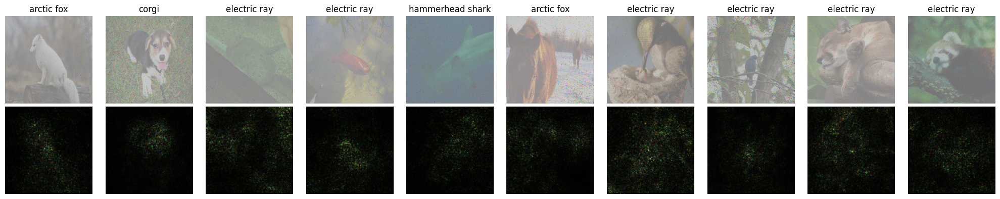

In [15]:
visualize_saliency_maps(noisy_predicted_labels, noisy_saliency, noisy_images)

### Observations

#### Zeroed images

- Even with a very low threshold, higher chances of misclassification
- Easily loses a lot of information, which understandably reduces model's chances of correctly classifying the images

#### Gaussian noisy images

- The modified dataset uses a very low threshold of 0.001 but even this successfully hides a lot of information
- The model does misclassify some of the images, but the number of misclassifications justifiably increases as threshold increases
- In this case, no information is "lost", it only seems to be hidden behind all the added noise so still has better saliency map than the zeroes dataset

## Fooling the Network

### Preprocessing

In [97]:
def dataset_processing():
    unnorm_imgs = []
    images = []
    labels = []
    main_folder = "datasets/network visualization"
    subfolders = sorted(os.listdir(main_folder))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    for sub in subfolders:
        img = os.listdir(main_folder + "/" + sub)[-1]
        img = cv2.imread(main_folder + "/" + sub + "/" + img)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224, 224))
        unnorm_imgs.append(img)
        # plt.imshow(img)
        # plt.show()
        img = (img / 255.0 - mean) / std
        images.append(img)
        labels.append(sub)
    
    unnorm_imgs = np.array(unnorm_imgs)
    images = np.array(images)
    labels = np.array(labels)
    return unnorm_imgs, images, labels

In [98]:
unnorm_imgs, images, labels = dataset_processing()

### Effect of Gaussian Noise

/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  Original Label   Predicted Label
0     arctic fox        arctic fox
1     arctic fox        arctic fox
2     arctic fox        arctic fox
3     arctic fox        arctic fox
4     arctic fox  hammerhead shark


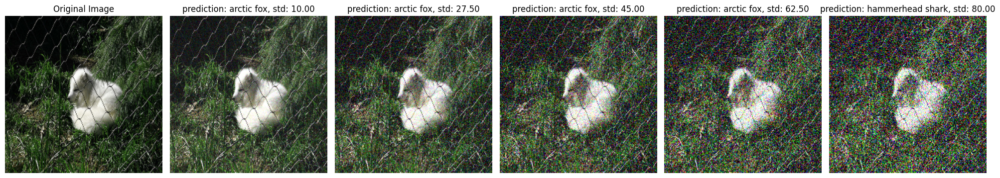

In [99]:
def add_gaussian_noise(image, mean=20, std=40):
    noise = np.random.normal(mean, std, image.shape)
    noisy_image = np.clip(image + noise, 0, 255)
    noisy_image = (noisy_image - noisy_image.min()) / (noisy_image.max() - noisy_image.min())
    return noisy_image

image_index = 0
original_image = unnorm_imgs[image_index]

noisy_images = [add_gaussian_noise(original_image, std=std) for std in np.linspace(10, 80, 5)]

mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
noisy_images_norm = (noisy_images - mean) / std
gt_labels = np.repeat(labels[image_index], len(noisy_images))
noisy_preds, _ = classify_and_generate_saliency(noisy_images_norm, gt_labels, labels)

fig, axes = plt.subplots(1, 6, figsize=(20, 4))
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[0].axis('off')

for i, noisy_img in enumerate(noisy_images):
    axes[i + 1].imshow(noisy_img)
    axes[i + 1].set_title(f'prediction: {noisy_preds[i]}, std: {np.linspace(10, 80, 5)[i]:.2f}')
    axes[i + 1].axis('off')

plt.tight_layout()
plt.show()

### Confuse the model

In [100]:
def train_confused_model(model, images, target_class, num_epochs=5):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    images_tensor = torch.tensor(images, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
    images_tensor.requires_grad = True
    optimizer = torch.optim.Adam([images_tensor], lr=0.01)
    
    for epoch in range(num_epochs):
        optimizer.zero_grad()
        outputs = model(images_tensor)
        loss = -outputs[torch.arange(outputs.shape[0]), target_class].sum()
        loss.backward()
        optimizer.step()
        images_tensor.data = torch.clamp(images_tensor.data, 0, 1)
    
    modified_images = images_tensor.detach().cpu().permute(0, 2, 3, 1).numpy()
    return modified_images

### Next Highest Class

In [101]:
def confuse_next_highest(images, classes):
    model = resnet18(pretrained=True)
    model.fc = torch.nn.Linear(model.fc.in_features, 10)
    model.load_state_dict(torch.load('datasets/network_visualization.pth'))
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    images_tensor = torch.tensor(images, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
    model.eval()
    images_tensor.requires_grad = True
    outputs = model(images_tensor)
    
    ordered_indices = torch.argsort(outputs, dim=-1, descending=True)
    target_class = ordered_indices[:, 1]
    target_class = target_class.cpu().numpy()
    target_labels = classes[target_class]
    
    for param in model.parameters():
        param.requires_grad = False
    
    modified_images = train_confused_model(model, images, target_class, 3)
    
    return modified_images, target_labels

In [102]:
next_highest_images, next_highest_target = confuse_next_highest(images, labels)
next_highest_preds, next_highest_saliency = classify_and_generate_saliency(next_highest_images, next_highest_target, labels)

/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


     Original Label   Predicted Label
0      indigo finch      indigo finch
1        arctic fox        arctic fox
2  hammerhead shark  hammerhead shark
3             horse             horse
4      electric ray      electric ray
5             corgi             corgi
6      indigo finch      indigo finch
7       hummingbird       hummingbird
8             horse             horse
9        arctic fox        arctic fox


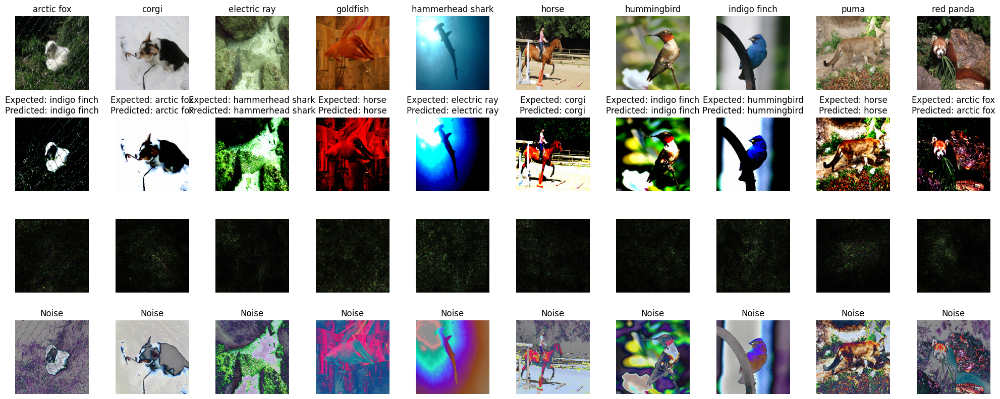

In [103]:
fig, axes = plt.subplots(4, 10, figsize=(20, 8))

for i in range(10):
    axes[0, i].imshow(unnorm_imgs[i])
    axes[0, i].axis('off')
    axes[0, i].set_title(labels[i])
    
    axes[1, i].imshow(next_highest_images[i])
    axes[1, i].axis('off')
    axes[1, i].set_title(f"Expected: {next_highest_target[i]}\nPredicted: {next_highest_preds[i]}")
    
    axes[2, i].imshow(next_highest_saliency[i], cmap='hot')
    axes[2, i].axis('off')
    
    noise = next_highest_images[i] - (unnorm_imgs[i] / 255.0)
    noise = (noise - noise.min()) / (noise.max() - noise.min())
    axes[3, i].imshow(noise)
    axes[3, i].axis('off')
    axes[3, i].set_title('Noise')

plt.tight_layout()
plt.show()

### Lowest Class

In [104]:
def confuse_lowest(images, classes):
    model = resnet18(pretrained=True)
    model.fc = torch.nn.Linear(model.fc.in_features, 10)
    model.load_state_dict(torch.load('datasets/network_visualization.pth'))
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    images_tensor = torch.tensor(images, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
    model.eval()
    images_tensor.requires_grad = True
    outputs = model(images_tensor)
    
    ordered_indices = torch.argsort(outputs, dim=-1, descending=True)
    target_class = ordered_indices[:, -1]
    target_class = target_class.cpu().numpy()
    target_labels = classes[target_class]
    
    for param in model.parameters():
        param.requires_grad = False
    
    modified_images = train_confused_model(model, images, target_class, 5)
    
    return modified_images, target_labels

In [105]:
lowest_images, lowest_target = confuse_lowest(images, labels)
lowest_preds, lowest_saliency = classify_and_generate_saliency(lowest_images, lowest_target, labels)

/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  Original Label Predicted Label
0           puma            puma
1   indigo finch    indigo finch
2    hummingbird     hummingbird
3   indigo finch    indigo finch
4      red panda       red panda
5     arctic fox      arctic fox
6     arctic fox      arctic fox
7          corgi           corgi
8       goldfish        goldfish
9   indigo finch    indigo finch


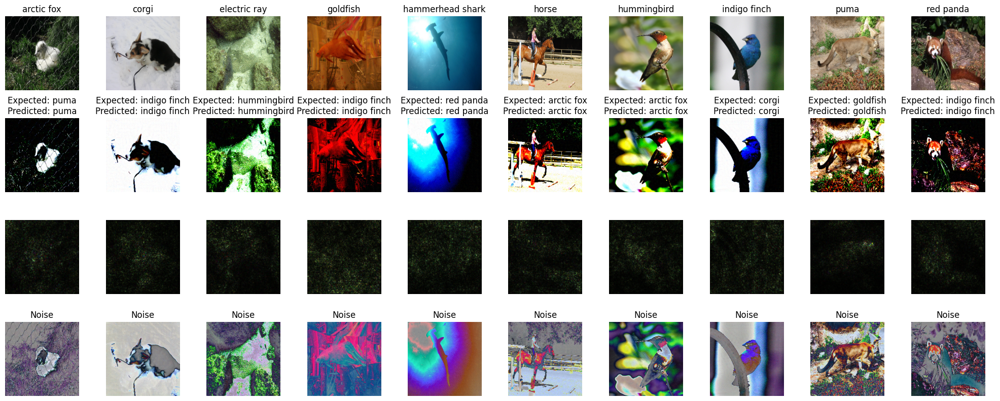

In [106]:
fig, axes = plt.subplots(4, 10, figsize=(20, 8))

for i in range(10):
    axes[0, i].imshow(unnorm_imgs[i])
    axes[0, i].axis('off')
    axes[0, i].set_title(labels[i])
    
    axes[1, i].imshow(lowest_images[i])
    axes[1, i].axis('off')
    axes[1, i].set_title(f"Expected: {lowest_target[i]}\nPredicted: {lowest_preds[i]}")
    
    axes[2, i].imshow(lowest_saliency[i], cmap='hot')
    axes[2, i].axis('off')
    
    noise = lowest_images[i] - (unnorm_imgs[i] / 255.0)
    noise = (noise - noise.min()) / (noise.max() - noise.min())
    axes[3, i].imshow(noise)
    axes[3, i].axis('off')
    axes[3, i].set_title('Noise')

plt.tight_layout()
plt.show()

### Observations

- The original image does not change by a lot in most cases (for both types of attacks)
- There are mainly two differences found - increase in intensity and change in color (while maintaining the regions)
- Between the images generated for both tasks - there is almost no visual difference in the noise added 
- However the values are such adjusted by the model, that the ResNet18 model ends up misclassifying the images as needed